In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# 5) remove checkpoints
# import os; _ = [os.remove(p) for p in __import__("glob").glob("libs/.ipynb_checkpoints/*.py") if os.path.exists(p)]


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

,open,high,low,close,volume,trade_count,vwap,ask,bid,ret,log_ret,sma_5,sma_pct_5,sma_9,sma_pct_9,sma_21,sma_pct_21,sma_50,sma_pct_50,sma_100,sma_pct_100,sma_200,sma_pct_200,ema_9,ema_21,ema_50,roc_5,roc_10,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,rsi_14,rsi_21,macd_line_6_13_5,macd_signal_6_13_5,macd_diff_6_13_5,macd_line_12_26_9,macd_signal_12_26_9,macd_diff_12_26_9,atr_7,atr_pct_7,atr_14,atr_pct_14,atr_28,atr_pct_28,plus_di_7,minus_di_7,adx_7,plus_di_14,minus_di_14,adx_14,plus_di_28,minus_di_28,adx_28,bb_lband_20_2p0,bb_hband_20_2p0,bb_w_20_2p0,bb_lband_20_3p0,bb_hband_20_3p0,bb_w_20_3p0,bb_lband_50_2p0,bb_hband_50_2p0,bb_w_50_2p0,obv,vol_spike_7,vol_spike_14,vol_spike_28,rolling_max_close_200,rolling_min_close_200,dist_high_200,dist_low_200,obv_diff_7,obv_pct_7,obv_diff_21,obv_pct_21,ret_std_21,ret_std_63,stoch_k_14_3_3,stoch_d_14_3_3,stoch_k_9_3_3,stoch_d_9_3_3,cci_14,cci_20,mfi_14,mfi_20,cmf_14,cmf_20,donch_h_20,donch_l_20,donch_w_20,donch_h_55,donch_l_55,donch_w_55,roll_vwap_20,roll_vwap_50,slope_close_20,slope_close_50,kc_mid_20_20_1.5,kc_l_20_20_1.5,kc_h_20_20_1.5,kc_w_20_20_1.5,kc_mid_20_20_2.0,kc_l_20_20_2.0,kc_h_20_20_2.0,kc_w_20_20_2.0,psar,psar_dir,vwap_ohlc_close_session
2018-12-26 08:00:00,36.650000,36.650000,36.6500,36.6500,5112.000000,24.000000,146.600000,36.657325,36.642675,-0.001022,-0.001023,36.668750,-0.000511,36.665417,-0.000420,36.661563,-0.000315,36.668680,-0.000509,36.668727,-0.000511,36.646224,0.000103,36.666900,36.665548,36.665788,0.000000,-0.001022,0.000161,0.000000,0.000000,0.0000,0.000,0.000000,37.320946,43.360089,44.823419,0.000447,0.001675,-0.001228,0.001076,0.000740,0.000336,0.016570,0.000452,0.016341,0.000446,0.014122,0.000385,24.712209,45.172846,33.158060,18.004021,30.981350,26.658551,17.117674,26.426272,14.540190,36.629281,36.695977,0.001819,36.612607,36.712651,0.002729,36.637717,36.699642,0.001689,1.042029e+10,2.496210,2.455416,1.196633,36.69,36.540,0.001091,0.003001,2044.666666,55.766986,14161.090908,386.265338,0.000309,0.000187,0.000000,59.523810,0.000000,58.333333,-133.345836,-83.791576,73.825792,65.540504,0.170617,-0.386750,36.6875,36.6325,0.001501,36.6875,36.6325,0.001501,36.653113,36.659199,0.001438,-0.000478,36.665601,36.642658,36.688544,0.001251,36.665601,36.635010,36.696192,0.001669,36.687500,-1,36.650000
2018-12-26 08:01:00,36.605000,36.605000,36.6050,36.6050,1240.000000,4.000000,146.420000,36.612325,36.597675,-0.001228,-0.001229,36.657875,-0.001442,36.657917,-0.001444,36.659885,-0.001497,36.667159,-0.001695,36.667990,-0.001718,36.645999,-0.001119,36.654520,36.660043,36.663404,-0.001483,-0.002248,-0.000961,0.000000,0.000000,0.0000,0.000,0.000000,22.151760,31.262627,34.572625,-0.008447,-0.001699,-0.006748,-0.003911,-0.000190,-0.003721,0.020632,0.000564,0.018388,0.000502,0.015225,0.000416,17.012158,62.256380,36.575072,14.856860,43.046031,28.231764,15.310698,34.192862,15.383149,36.620707,36.701416,0.002202,36.600529,36.721593,0.003302,36.631639,36.702680,0.001937,1.042028e+10,0.578590,0.676157,0.292495,36.69,36.540,0.002322,0.001776,1378.000000,37.591765,21208.363636,578.516914,0.000410,0.000242,0.000000,33.333333,0.000000,33.333333,-274.272317,-287.679210,65.461964,72.965663,0.177732,-0.299535,36.6875,36.6050,0.002254,36.6875,36.6050,0.002254,36.654455,36.657053,0.000200,-0.000597,36.659830,36.634658,36.685001,0.001373,36.659830,36.626268,36.693391,0.001831,36.687500,-1,36.641215
2018-12-26 08:02:00,36.607917,36.607917,36.6075,36.6075,1237.333333,3.833333,146.430577,36.614825,36.600175,0.000068,0.000068,36.645625,-0.001040,36.651528,-0.001201,36.658511,-0.001392,36.665650,-0.001586,36.667234,-0.001629,36.645898,-0.001048,36.645116,36.655267,36.661212,-0.001670,-0.001772,-0.000788,-0.000417,-0.000011,0.0000,0.000,0.000011,24.205549,32.391174,35.433963,-0.013191,-0.005530,-0.007661,-0.007574,-0.001667,-0.005907,0.018101,0.000494,0.017283,0.000472,0.014785,0.000404,18.922467,60.823292,38.856207,15.883200,42.527142,29.473431,15.907368,33.951960,16.126287,36.614724,36.7

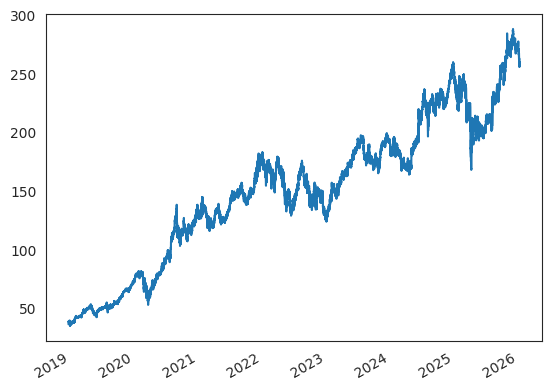

In [3]:
# Read the unscaled indicators dataframe

df_inds = pd.read_csv(params.indunsc_csv, index_col=0, parse_dates=True) # indunsc_test_csv
# df_inds = df_inds[(df_inds.index >= '2017-07-15') & (df_inds.index < '2018-12-25')] ########### train ##############
df_inds = df_inds[df_inds.index >= '2018-12-25'] ########### test ##############

df_inds.close.plot()
df_inds

In [4]:
# importlib.reload(params) #####
# importlib.reload(strategies) #####

first_day = df_inds.index.normalize().min()
start_ask = df_inds.loc[df_inds.index.normalize() == first_day, "ask"].iloc[0]
strategies.reset_globals(start_ask)  # reset globals and initialize buy&hold with canonical first-day ask

sim_results = {}
groups = df_inds.groupby(df_inds.index.normalize())
total_days = df_inds.index.normalize().nunique()

col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_actions_alpaca(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = params.col_atr_tick,
        col_adx         = params.col_adx_tick,
        col_vol_spike   = params.col_vol_spike_tick,
        col_rsi         = params.col_rsi_tick,
        col_vwap        = params.col_vwap_tick,
        reset_peak      = params.reset_peak_tick,
        rsi_min_thresh  = params.rsi_min_thresh_tick,
        rsi_max_thresh  = params.rsi_max_thresh_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        vol_thresh      = params.vol_thresh_tick,
        adx_thresh      = params.adx_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        sess_start      = params.sess_premark
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/1770 [00:00<?, ?it/s]

Loop finished. Days simulated: 1770


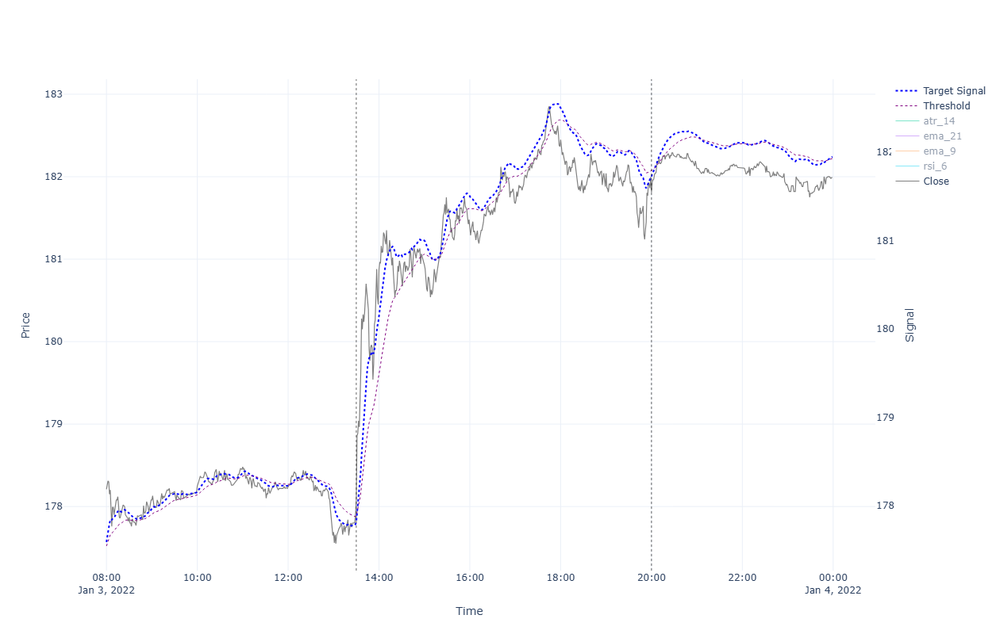


                                                  ******* Performance for 2022-01-03 *******

INTRADAY:
  shares(589); [ask_buy=178.115, fee_buy=0.004, pos_amnt_buy=104912.385]; [bid_sell=181.774, fee_sell=0.018, pos_amnt_sell=107053.947]; leftover=6.737; PNL=2141.562
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(2727); [start=178.115 end=181.774]; leftover=24.567; total_cap=495671.62; PNL=11423.414




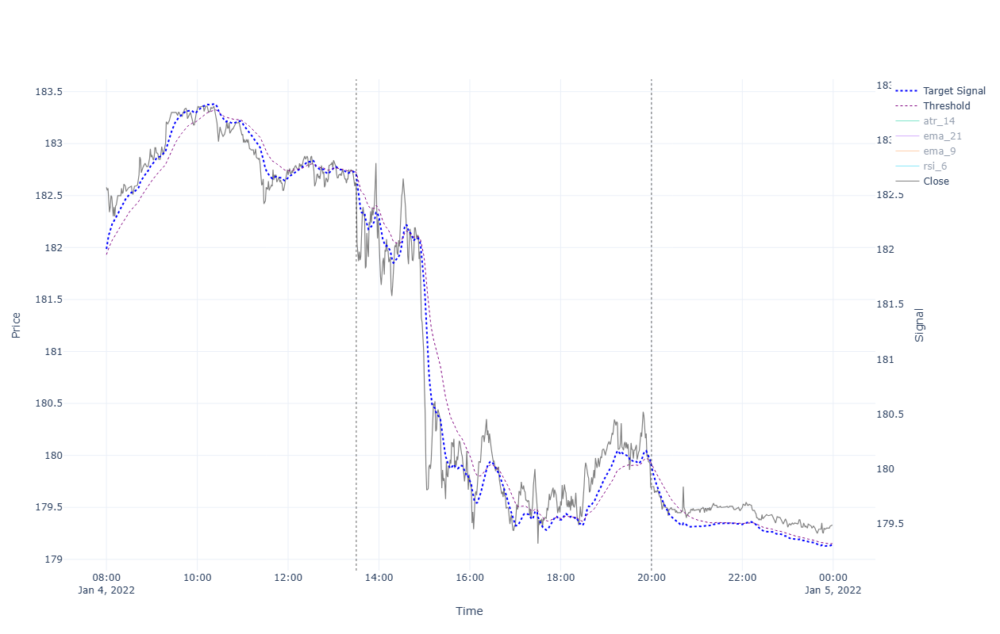


                                                  ******* Performance for 2022-01-04 *******

INTRADAY:
  shares(586); [ask_buy=182.617, fee_buy=0.004, pos_amnt_buy=107015.613]; [bid_sell=179.664, fee_sell=0.018, pos_amnt_sell=105272.542]; leftover=45.071; PNL=-1743.071
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(2727); [start=182.617 end=179.664]; leftover=24.567; total_cap=489919.145; PNL=-5752.475




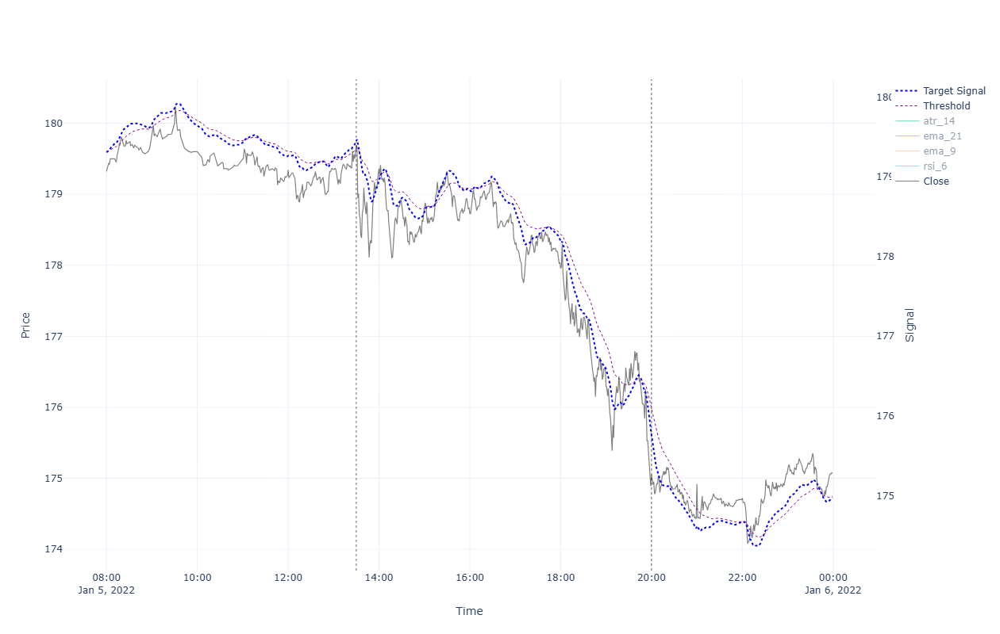


                                                  ******* Performance for 2022-01-05 *******

INTRADAY:
  shares(585); [ask_buy=179.726, fee_buy=0.004, pos_amnt_buy=105141.991]; [bid_sell=175.015, fee_sell=0.018, pos_amnt_sell=102373.235]; leftover=175.622; PNL=-2768.756
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(2727); [start=179.726 end=175.015]; leftover=24.567; total_cap=477241.34; PNL=-12677.805




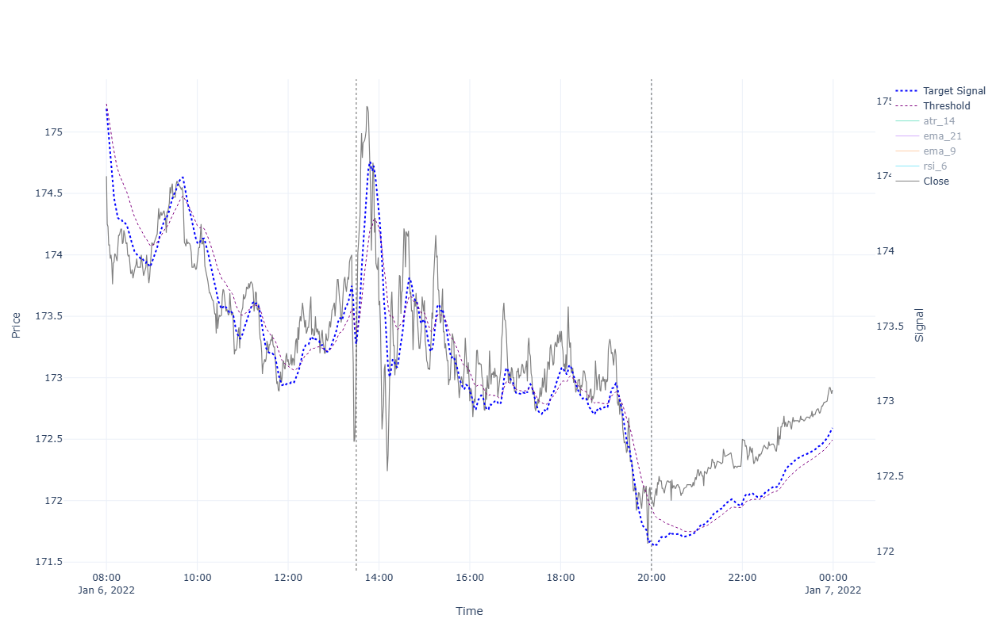


                                                  ******* Performance for 2022-01-06 *******

INTRADAY:
  shares(592); [ask_buy=173.215, fee_buy=0.004, pos_amnt_buy=102545.411]; [bid_sell=171.976, fee_sell=0.018, pos_amnt_sell=101798.93]; leftover=3.446; PNL=-746.481
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(2727); [start=173.215 end=171.976]; leftover=24.567; total_cap=468953.086; PNL=-8288.254




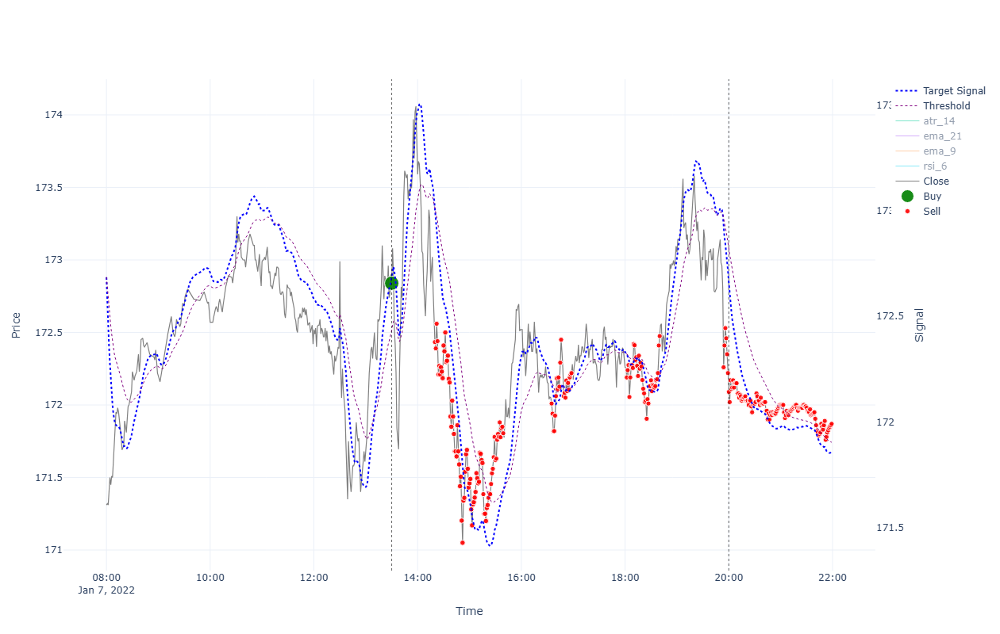


                                                  ******* Performance for 2022-01-07 *******

INTRADAY:
  shares(588); [ask_buy=172.875, fee_buy=0.004, pos_amnt_buy=101652.617]; [bid_sell=172.056, fee_sell=0.018, pos_amnt_sell=101158.139]; leftover=149.76; PNL=-494.478
TRADES:
  Tr[1]: Time(13:30)Ask(172.875)Bid(172.805)Act(Buy)Shrs(595)Pos(595); CashTr(-102862.767)=Cost(-102860.387)-Fee(-2.38); P&L(104329.454)=CashTot(1510.241)+PosAmt(102819.213)
  Tr[2]: Time(14:20)Ask(172.468)Bid(172.399)Act(Sell)Shrs(1)Pos(594); CashTr(172.381)=Cost(172.399)-Fee(-0.018); P&L(104087.687)=CashTot(1682.622)+PosAmt(102405.065)
  Tr[3]: Time(14:21)Ask(172.424)Bid(172.356)Act(Sell)Shrs(1)Pos(593); CashTr(172.338)=Cost(172.356)-Fee(-0.018); P&L(104061.771)=CashTot(1854.96)+PosAmt(102206.812)
  Tr[4]: Time(14:22)Ask(172.595)Bid(172.525)Act(Sell)Shrs(1)Pos(592); CashTr(172.508)=Cost(172.525)-Fee(-0.018); P&L(104162.563)=CashTot(2027.467)+PosAmt(102135.096)
  Tr[5]: Time(14:23)Ask(172.475)Bid(172.405)Act(Se

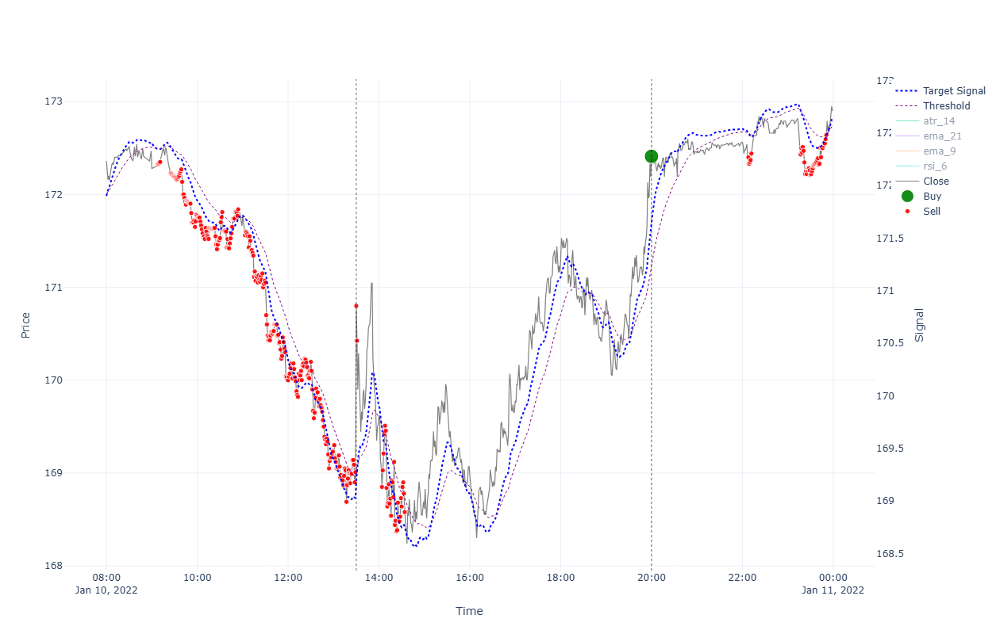


                                                  ******* Performance for 2022-01-10 *******

INTRADAY:
  shares(593); [ask_buy=170.834, fee_buy=0.004, pos_amnt_buy=101307.053]; [bid_sell=172.375, fee_sell=0.018, pos_amnt_sell=102208.023]; leftover=0.846; PNL=900.971
TRADES:
  Tr[1]: Time(09:08)Ask(172.359)Bid(172.29)Act(Sell)Shrs(1)Pos(273); CashTr(172.272)=Cost(172.29)-Fee(-0.018); P&L(103882.163)=CashTot(56847.052)+PosAmt(47035.111)
  Tr[2]: Time(09:09)Ask(172.367)Bid(172.298)Act(Sell)Shrs(1)Pos(272); CashTr(172.28)=Cost(172.298)-Fee(-0.018); P&L(103884.485)=CashTot(57019.332)+PosAmt(46865.153)
  Tr[3]: Time(09:10)Ask(172.376)Bid(172.307)Act(Sell)Shrs(1)Pos(271); CashTr(172.289)=Cost(172.307)-Fee(-0.018); P&L(103886.799)=CashTot(57191.621)+PosAmt(46695.178)
  Tr[4]: Time(09:11)Ask(172.385)Bid(172.315)Act(Sell)Shrs(1)Pos(270); CashTr(172.298)=Cost(172.315)-Fee(-0.018); P&L(103889.104)=CashTot(57363.919)+PosAmt(46525.185)
  Tr[5]: Time(09:25)Ask(172.264)Bid(172.196)Act(Sell)Shrs(1)Po

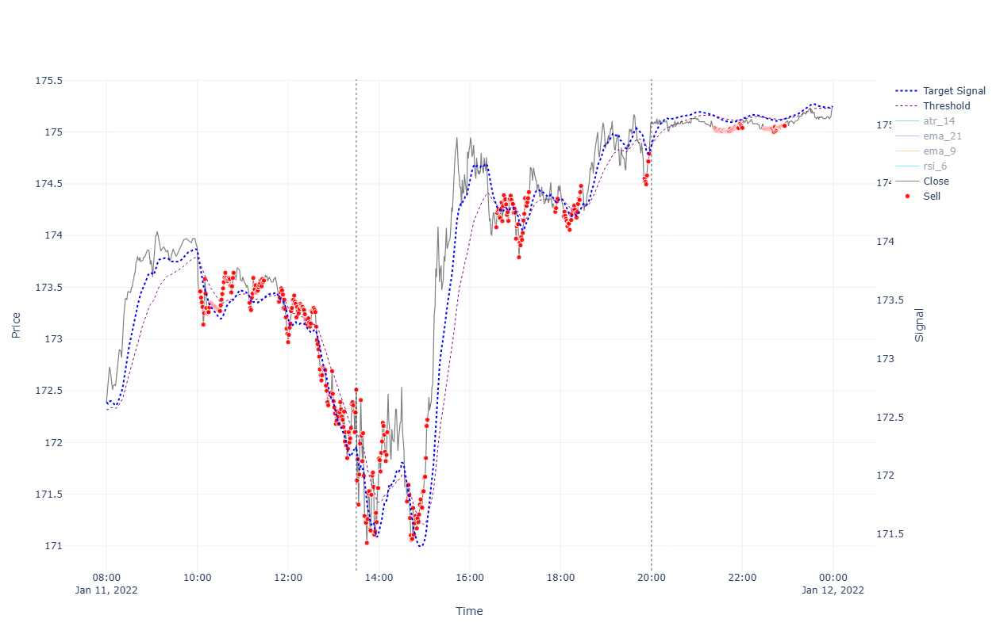


                                                  ******* Performance for 2022-01-11 *******

INTRADAY:
  shares(592); [ask_buy=172.544, fee_buy=0.004, pos_amnt_buy=102148.712]; [bid_sell=175.045, fee_sell=0.018, pos_amnt_sell=103615.974]; leftover=60.157; PNL=1467.262
TRADES:
  Tr[1]: Time(10:03)Ask(173.49)Bid(173.42)Act(Sell)Shrs(1)Pos(550); CashTr(173.402)=Cost(173.42)-Fee(-0.018); P&L(103910.731)=CashTot(8529.566)+PosAmt(95381.165)
  Tr[2]: Time(10:04)Ask(173.495)Bid(173.425)Act(Sell)Shrs(1)Pos(549); CashTr(173.407)=Cost(173.425)-Fee(-0.018); P&L(103913.463)=CashTot(8702.973)+PosAmt(95210.49)
  Tr[3]: Time(10:05)Ask(173.435)Bid(173.365)Act(Sell)Shrs(1)Pos(548); CashTr(173.347)=Cost(173.365)-Fee(-0.018); P&L(103880.505)=CashTot(8876.321)+PosAmt(95004.184)
  Tr[4]: Time(10:06)Ask(173.39)Bid(173.32)Act(Sell)Shrs(1)Pos(547); CashTr(173.302)=Cost(173.32)-Fee(-0.018); P&L(103855.827)=CashTot(9049.623)+PosAmt(94806.204)
  Tr[5]: Time(10:07)Ask(173.345)Bid(173.275)Act(Sell)Shrs(1)Pos(546)

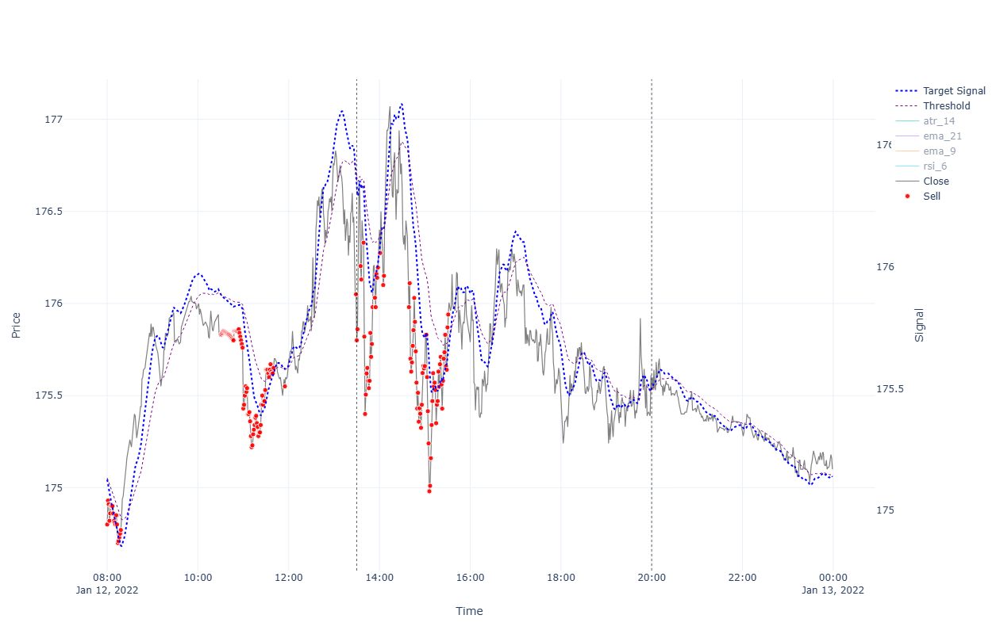


                                                  ******* Performance for 2022-01-12 *******

INTRADAY:
  shares(589); [ask_buy=175.835, fee_buy=0.004, pos_amnt_buy=103569.289]; [bid_sell=175.495, fee_sell=0.018, pos_amnt_sell=103355.878]; leftover=106.842; PNL=-213.411
TRADES:
  Tr[1]: Time(08:00)Ask(174.835)Bid(174.765)Act(Sell)Shrs(1)Pos(168); CashTr(174.747)=Cost(174.765)-Fee(-0.018); P&L(104098.148)=CashTot(74737.628)+PosAmt(29360.52)
  Tr[2]: Time(08:01)Ask(174.965)Bid(174.895)Act(Sell)Shrs(1)Pos(167); CashTr(174.877)=Cost(174.895)-Fee(-0.018); P&L(104119.97)=CashTot(74912.505)+PosAmt(29207.465)
  Tr[3]: Time(08:02)Ask(174.945)Bid(174.875)Act(Sell)Shrs(1)Pos(166); CashTr(174.857)=Cost(174.875)-Fee(-0.018); P&L(104116.612)=CashTot(75087.362)+PosAmt(29029.25)
  Tr[4]: Time(08:03)Ask(174.855)Bid(174.785)Act(Sell)Shrs(1)Pos(165); CashTr(174.767)=Cost(174.785)-Fee(-0.018); P&L(104101.654)=CashTot(75262.129)+PosAmt(28839.525)
  Tr[5]: Time(08:04)Ask(174.895)Bid(174.825)Act(Sell)Shrs(1

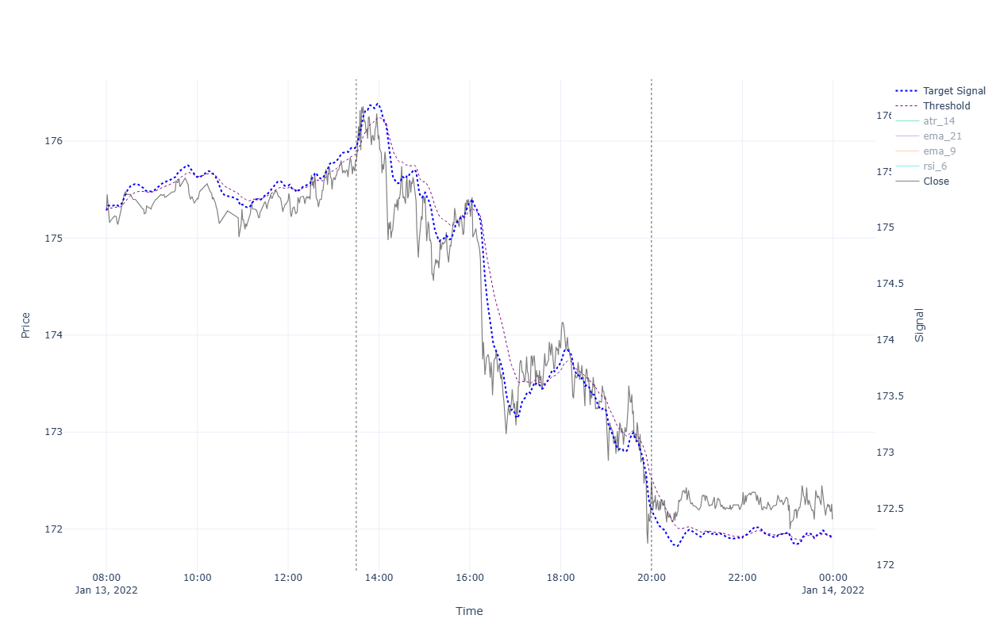


                                                  ******* Performance for 2022-01-13 *******

INTRADAY:
  shares(588); [ask_buy=175.832, fee_buy=0.004, pos_amnt_buy=103391.686]; [bid_sell=172.465, fee_sell=0.018, pos_amnt_sell=101399.154]; leftover=71.034; PNL=-1992.531
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(2727); [start=175.832 end=172.465]; leftover=24.567; total_cap=470289.013; PNL=-8260.985




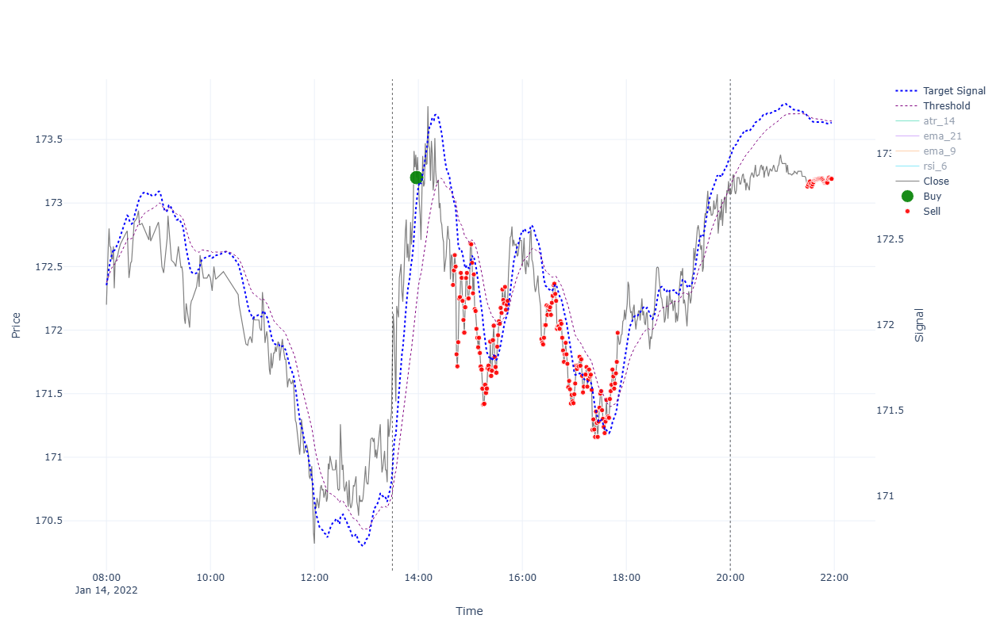


                                                  ******* Performance for 2022-01-14 *******

INTRADAY:
  shares(590); [ask_buy=171.794, fee_buy=0.004, pos_amnt_buy=101361.056]; [bid_sell=173.075, fee_sell=0.018, pos_amnt_sell=102103.882]; leftover=109.133; PNL=742.826
TRADES:
  Tr[1]: Time(13:58)Ask(173.235)Bid(173.165)Act(Buy)Shrs(593)Pos(593); CashTr(-102730.49)=Cost(-102728.118)-Fee(-2.372); P&L(104180.273)=CashTot(1493.191)+PosAmt(102687.082)
  Tr[2]: Time(14:40)Ask(172.39)Bid(172.321)Act(Sell)Shrs(1)Pos(592); CashTr(172.303)=Cost(172.321)-Fee(-0.018); P&L(103679.586)=CashTot(1665.494)+PosAmt(102014.091)
  Tr[3]: Time(14:41)Ask(172.505)Bid(172.435)Act(Sell)Shrs(1)Pos(591); CashTr(172.418)=Cost(172.435)-Fee(-0.018); P&L(103747.292)=CashTot(1837.912)+PosAmt(101909.38)
  Tr[4]: Time(14:42)Ask(172.625)Bid(172.555)Act(Sell)Shrs(1)Pos(590); CashTr(172.538)=Cost(172.555)-Fee(-0.018); P&L(103818.194)=CashTot(2010.449)+PosAmt(101807.745)
  Tr[5]: Time(14:43)Ask(172.535)Bid(172.465)Act(Sel

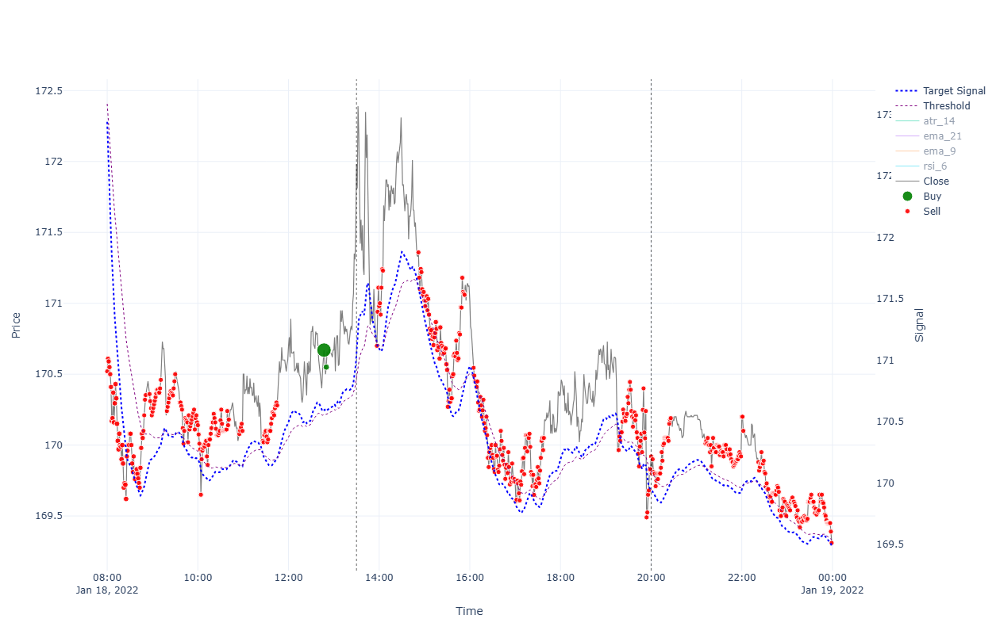


                                                  ******* Performance for 2022-01-18 *******

INTRADAY:
  shares(594); [ask_buy=172.016, fee_buy=0.004, pos_amnt_buy=102179.642]; [bid_sell=169.886, fee_sell=0.018, pos_amnt_sell=100901.652]; leftover=33.373; PNL=-1277.991
TRADES:
  Tr[1]: Time(08:00)Ask(170.554)Bid(170.486)Act(Sell)Shrs(1)Pos(389); CashTr(170.468)=Cost(170.486)-Fee(-0.018); P&L(102892.262)=CashTot(36573.247)+PosAmt(66319.015)
  Tr[2]: Time(08:01)Ask(170.644)Bid(170.576)Act(Sell)Shrs(1)Pos(388); CashTr(170.558)=Cost(170.576)-Fee(-0.018); P&L(102927.254)=CashTot(36743.805)+PosAmt(66183.449)
  Tr[3]: Time(08:02)Ask(170.624)Bid(170.556)Act(Sell)Shrs(2)Pos(386); CashTr(341.076)=Cost(341.112)-Fee(-0.036); P&L(102919.458)=CashTot(37084.881)+PosAmt(65834.577)
  Tr[4]: Time(08:03)Ask(170.584)Bid(170.516)Act(Sell)Shrs(2)Pos(384); CashTr(340.996)=Cost(341.032)-Fee(-0.036); P&L(102903.982)=CashTot(37425.877)+PosAmt(65478.106)
  Tr[5]: Time(08:04)Ask(170.534)Bid(170.466)Act(Sell)Shr

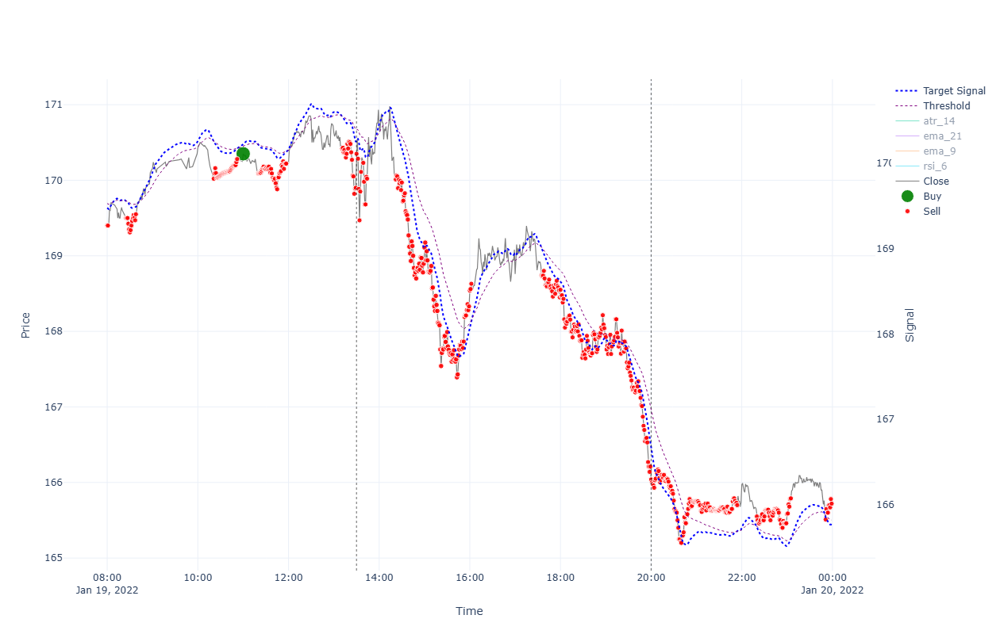


                                                  ******* Performance for 2022-01-19 *******

INTRADAY:
  shares(592); [ask_buy=170.384, fee_buy=0.004, pos_amnt_buy=100869.755]; [bid_sell=166.007, fee_sell=0.018, pos_amnt_sell=98265.482]; leftover=65.269; PNL=-2604.273
TRADES:
  Tr[1]: Time(08:00)Ask(169.434)Bid(169.366)Act(Sell)Shrs(1)Pos(172); CashTr(169.348)=Cost(169.366)-Fee(-0.018); P&L(102301.386)=CashTot(73170.416)+PosAmt(29130.969)
  Tr[2]: Time(08:01)Ask(169.434)Bid(169.366)Act(Sell)Shrs(1)Pos(171); CashTr(169.348)=Cost(169.366)-Fee(-0.018); P&L(102301.368)=CashTot(73339.765)+PosAmt(28961.603)
  Tr[3]: Time(08:25)Ask(169.534)Bid(169.466)Act(Sell)Shrs(1)Pos(170); CashTr(169.448)=Cost(169.466)-Fee(-0.018); P&L(102318.45)=CashTot(73509.213)+PosAmt(28809.237)
  Tr[4]: Time(08:26)Ask(169.534)Bid(169.466)Act(Sell)Shrs(1)Pos(169); CashTr(169.448)=Cost(169.466)-Fee(-0.018); P&L(102318.432)=CashTot(73678.661)+PosAmt(28639.771)
  Tr[5]: Time(08:27)Ask(169.534)Bid(169.466)Act(Sell)Shrs(

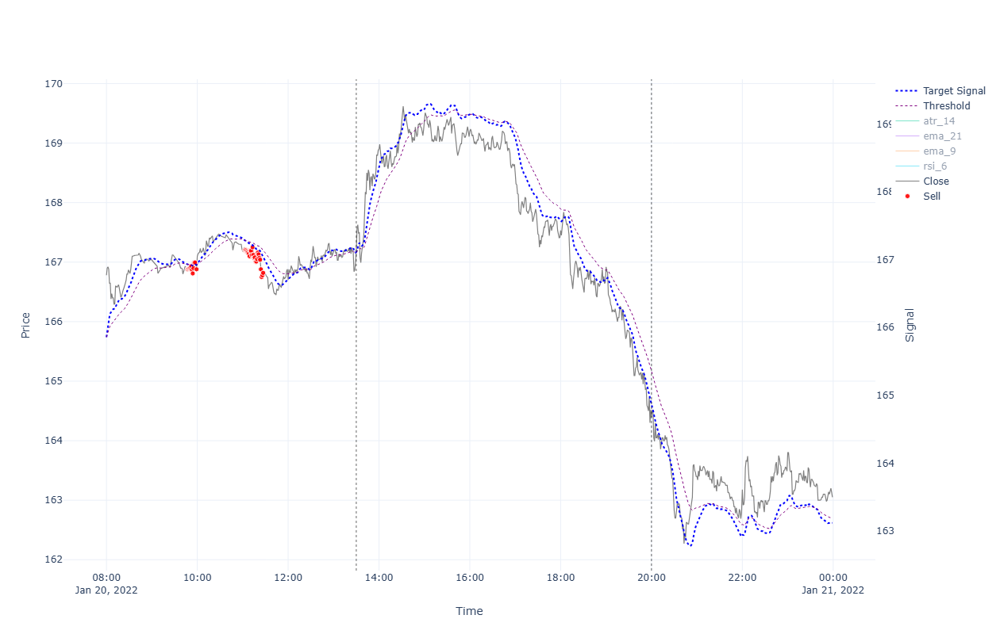


                                                  ******* Performance for 2022-01-20 *******

INTRADAY:
  shares(588); [ask_buy=167.213, fee_buy=0.004, pos_amnt_buy=98323.831]; [bid_sell=164.357, fee_sell=0.018, pos_amnt_sell=96631.524]; leftover=6.92; PNL=-1692.307
TRADES:
  Tr[1]: Time(09:47)Ask(166.913)Bid(166.847)Act(Sell)Shrs(1)Pos(36); CashTr(166.829)=Cost(166.847)-Fee(-0.018); P&L(100779.119)=CashTot(94772.641)+PosAmt(6006.478)
  Tr[2]: Time(09:48)Ask(166.921)Bid(166.854)Act(Sell)Shrs(1)Pos(35); CashTr(166.836)=Cost(166.854)-Fee(-0.018); P&L(100779.371)=CashTot(94939.477)+PosAmt(5839.893)
  Tr[3]: Time(09:49)Ask(166.928)Bid(166.862)Act(Sell)Shrs(1)Pos(34); CashTr(166.844)=Cost(166.862)-Fee(-0.018); P&L(100779.615)=CashTot(95106.321)+PosAmt(5673.294)
  Tr[4]: Time(09:50)Ask(166.936)Bid(166.869)Act(Sell)Shrs(1)Pos(33); CashTr(166.851)=Cost(166.869)-Fee(-0.018); P&L(100779.853)=CashTot(95273.172)+PosAmt(5506.68)
  Tr[5]: Time(09:51)Ask(166.943)Bid(166.877)Act(Sell)Shrs(1)Pos(32); 

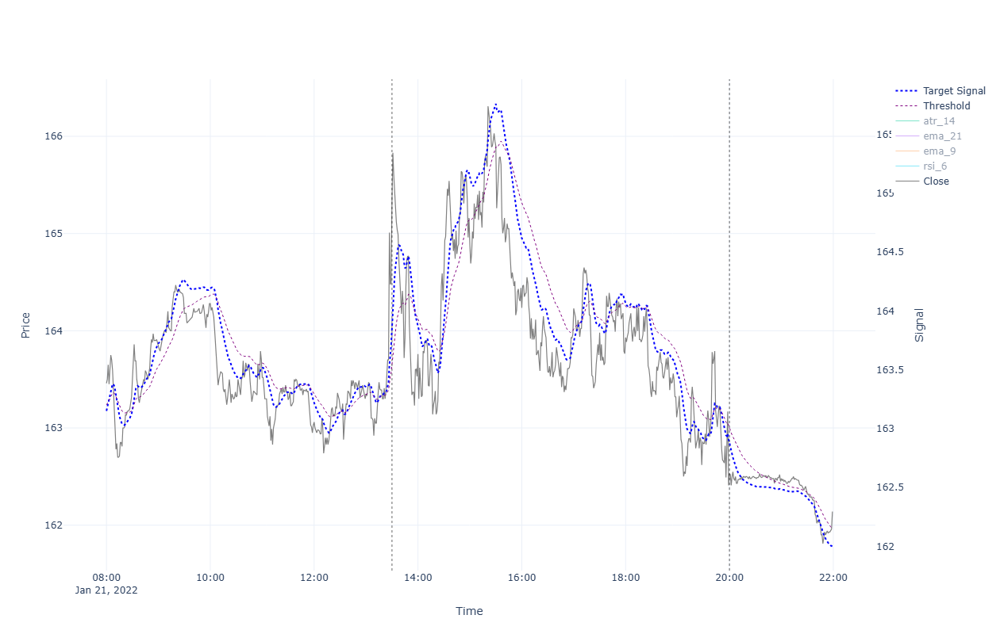


                                                  ******* Performance for 2022-01-21 *******

INTRADAY:
  shares(584); [ask_buy=165.383, fee_buy=0.004, pos_amnt_buy=96586.066]; [bid_sell=162.498, fee_sell=0.018, pos_amnt_sell=94888.186]; leftover=52.378; PNL=-1697.881
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(2727); [start=165.383 end=162.498]; leftover=24.567; total_cap=443106.899; PNL=-5071.013




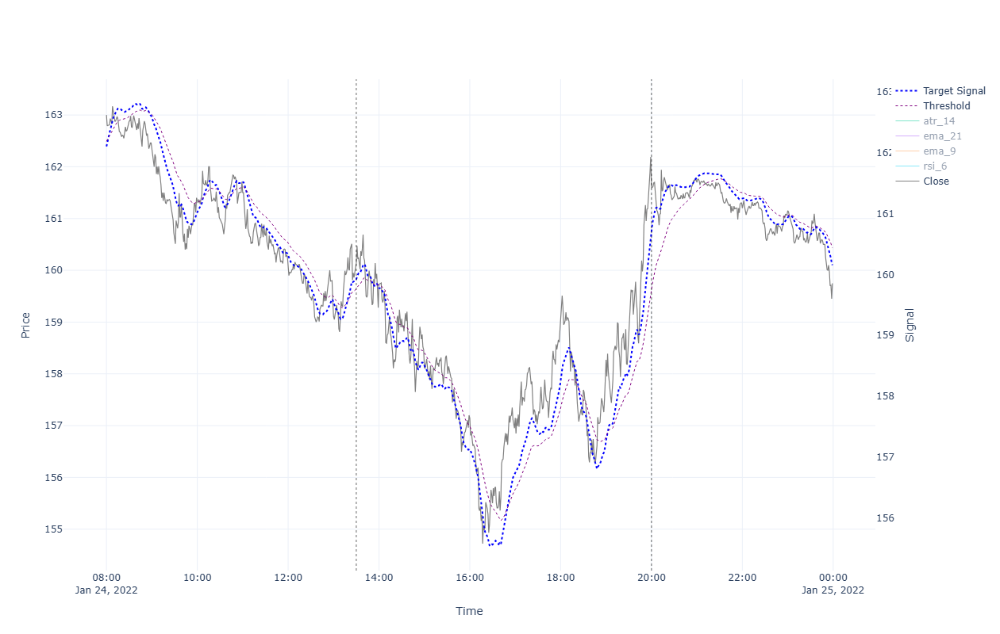


                                                  ******* Performance for 2022-01-24 *******

INTRADAY:
  shares(592); [ask_buy=160.172, fee_buy=0.004, pos_amnt_buy=94824.192]; [bid_sell=161.568, fee_sell=0.018, pos_amnt_sell=95637.595]; leftover=116.371; PNL=813.403
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(2727); [start=160.172 end=161.568]; leftover=24.567; total_cap=440571.392; PNL=-2535.507




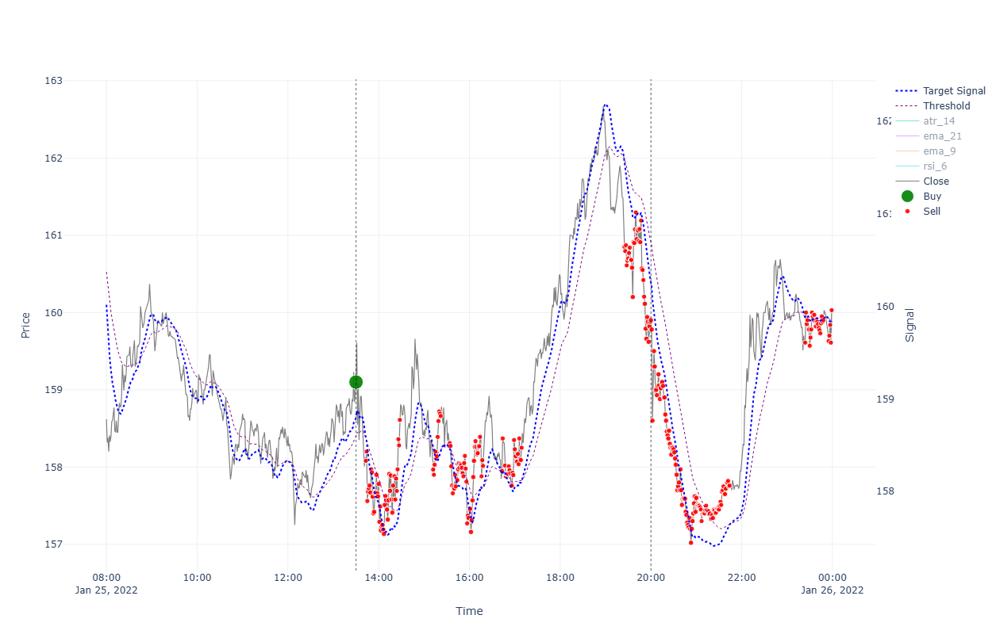


                                                  ******* Performance for 2022-01-25 *******

INTRADAY:
  shares(601); [ask_buy=159.132, fee_buy=0.004, pos_amnt_buy=95640.616]; [bid_sell=159.868, fee_sell=0.018, pos_amnt_sell=96070.048]; leftover=113.35; PNL=429.433
TRADES:
  Tr[1]: Time(13:30)Ask(159.132)Bid(159.068)Act(Buy)Shrs(625)Pos(625); CashTr(-99459.875)=Cost(-99457.375)-Fee(-2.5); P&L(100741.392)=CashTot(1323.767)+PosAmt(99417.625)
  Tr[2]: Time(13:43)Ask(158.112)Bid(158.048)Act(Sell)Shrs(1)Pos(624); CashTr(158.031)=Cost(158.048)-Fee(-0.018); P&L(100103.999)=CashTot(1481.797)+PosAmt(98622.202)
  Tr[3]: Time(13:44)Ask(158.232)Bid(158.168)Act(Sell)Shrs(1)Pos(623); CashTr(158.151)=Cost(158.168)-Fee(-0.018); P&L(100178.799)=CashTot(1639.948)+PosAmt(98538.851)
  Tr[4]: Time(13:45)Ask(157.591)Bid(157.529)Act(Sell)Shrs(1)Pos(622); CashTr(157.511)=Cost(157.529)-Fee(-0.018); P&L(99780.186)=CashTot(1797.459)+PosAmt(97982.727)
  Tr[5]: Time(13:46)Ask(157.712)Bid(157.649)Act(Sell)Shrs(1)

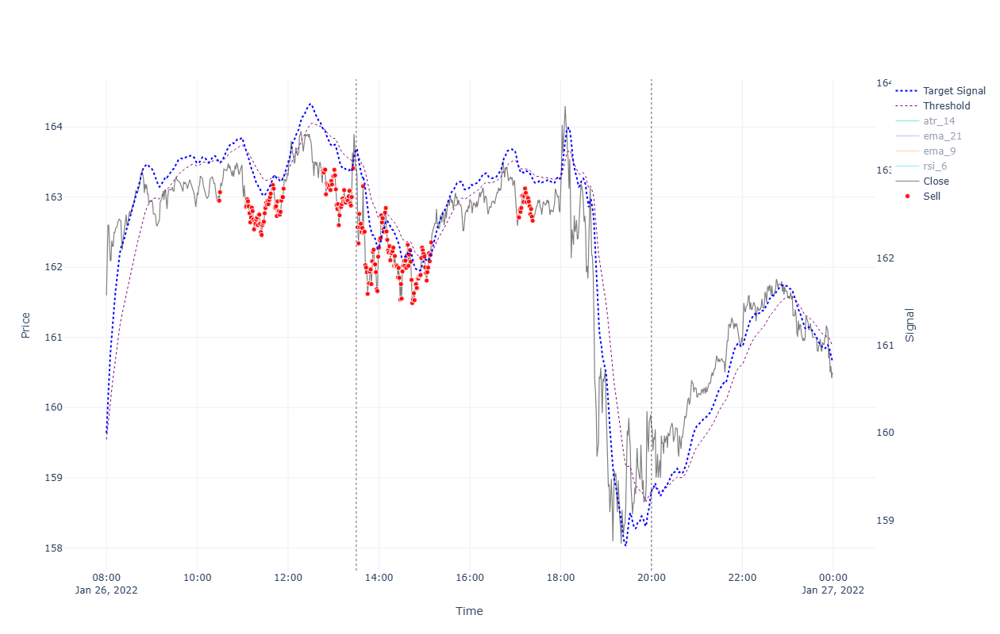


                                                  ******* Performance for 2022-01-26 *******

INTRADAY:
  shares(588); [ask_buy=163.443, fee_buy=0.004, pos_amnt_buy=96106.66]; [bid_sell=159.678, fee_sell=0.018, pos_amnt_sell=93880.335]; leftover=76.739; PNL=-2226.324
TRADES:
  Tr[1]: Time(10:29)Ask(162.983)Bid(162.917)Act(Sell)Shrs(1)Pos(209); CashTr(162.9)=Cost(162.917)-Fee(-0.018); P&L(101226.512)=CashTot(67176.775)+PosAmt(34049.737)
  Tr[2]: Time(10:30)Ask(163.103)Bid(163.037)Act(Sell)Shrs(1)Pos(208); CashTr(163.02)=Cost(163.037)-Fee(-0.018); P&L(101251.574)=CashTot(67339.795)+PosAmt(33911.779)
  Tr[3]: Time(11:04)Ask(162.893)Bid(162.827)Act(Sell)Shrs(1)Pos(207); CashTr(162.81)=Cost(162.827)-Fee(-0.018); P&L(101207.876)=CashTot(67502.605)+PosAmt(33705.272)
  Tr[4]: Time(11:05)Ask(162.903)Bid(162.837)Act(Sell)Shrs(1)Pos(206); CashTr(162.82)=Cost(162.837)-Fee(-0.018); P&L(101209.929)=CashTot(67665.424)+PosAmt(33544.504)
  Tr[5]: Time(11:06)Ask(163.003)Bid(162.937)Act(Sell)Shrs(1)Pos(

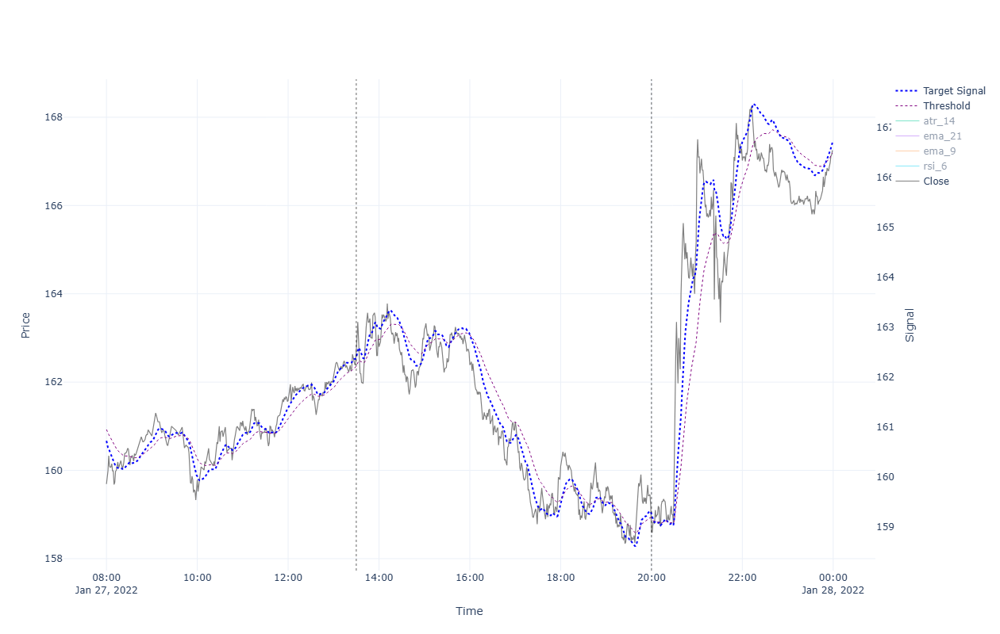


                                                  ******* Performance for 2022-01-27 *******

INTRADAY:
  shares(577); [ask_buy=162.713, fee_buy=0.004, pos_amnt_buy=93887.42]; [bid_sell=158.578, fee_sell=0.018, pos_amnt_sell=91489.501]; leftover=69.654; PNL=-2397.92
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(2727); [start=162.713 end=158.578]; leftover=24.567; total_cap=432419.485; PNL=-2999.086




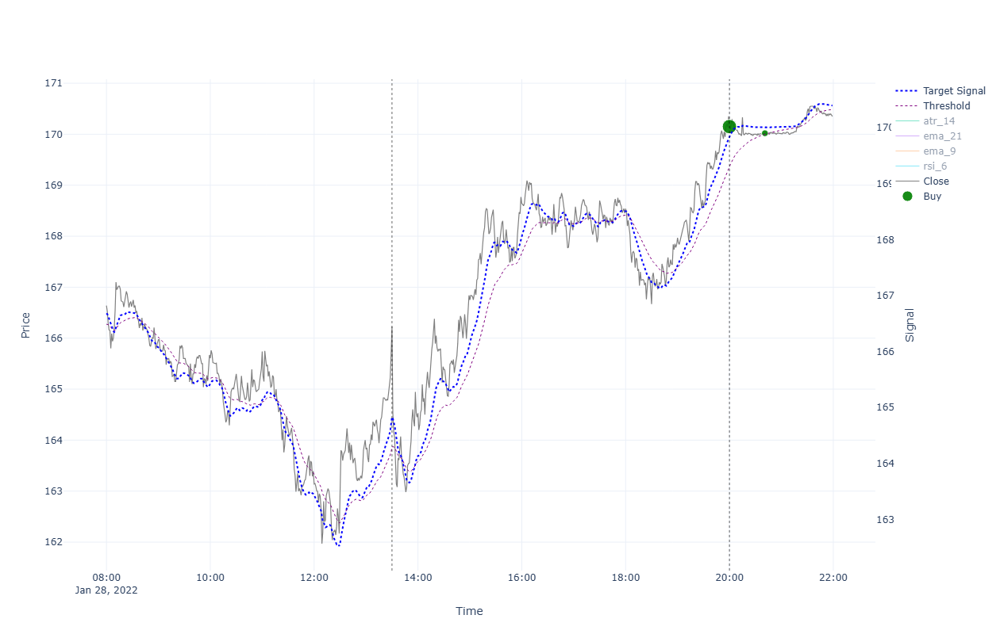


                                                  ******* Performance for 2022-01-28 *******

INTRADAY:
  shares(550); [ask_buy=166.258, fee_buy=0.004, pos_amnt_buy=91444.21]; [bid_sell=170.116, fee_sell=0.018, pos_amnt_sell=93553.952]; leftover=114.944; PNL=2109.742
TRADES:
  Tr[1]: Time(20:00)Ask(170.184)Bid(170.116)Act(Buy)Shrs(586)Pos(586); CashTr(-99730.168)=Cost(-99727.824)-Fee(-2.344); P&L(101096.474)=CashTot(1408.498)+PosAmt(99687.976)
  Tr[2]: Time(20:41)Ask(170.054)Bid(169.986)Act(Buy)Shrs(8)Pos(594); CashTr(-1360.464)=Cost(-1360.432)-Fee(-0.032); P&L(101019.718)=CashTot(48.034)+PosAmt(100971.684)
STRATEGY:
  Δ[1]:-42.192 + Δ[2]:-76.756 PNL=-118.948
BUYNHOLD:
  shares(2727); [start=166.258 end=170.116]; leftover=24.567; total_cap=463882.073; PNL=31462.587




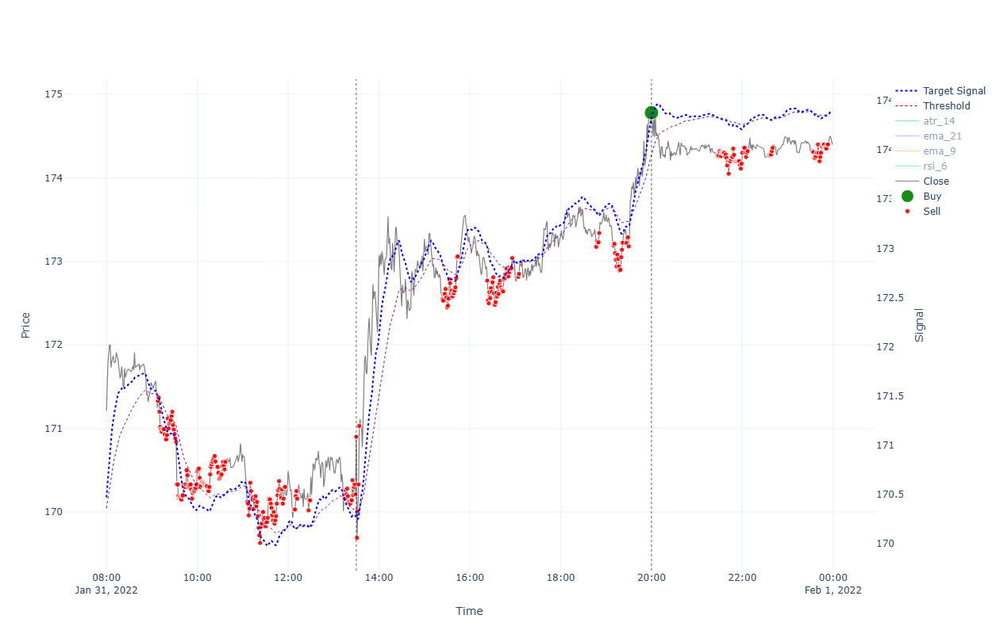


                                                  ******* Performance for 2022-01-31 *******

INTRADAY:
  shares(547); [ask_buy=170.934, fee_buy=0.004, pos_amnt_buy=93503.195]; [bid_sell=174.745, fee_sell=0.018, pos_amnt_sell=95575.663]; leftover=165.701; PNL=2072.468
TRADES:
  Tr[1]: Time(09:08)Ask(171.364)Bid(171.296)Act(Sell)Shrs(1)Pos(593); CashTr(171.278)=Cost(171.296)-Fee(-0.018); P&L(101797.662)=CashTot(219.312)+PosAmt(101578.35)
  Tr[2]: Time(09:09)Ask(171.404)Bid(171.336)Act(Sell)Shrs(1)Pos(592); CashTr(171.318)=Cost(171.336)-Fee(-0.018); P&L(101821.364)=CashTot(390.63)+PosAmt(101430.734)
  Tr[3]: Time(09:10)Ask(171.234)Bid(171.166)Act(Sell)Shrs(1)Pos(591); CashTr(171.148)=Cost(171.166)-Fee(-0.018); P&L(101720.766)=CashTot(561.778)+PosAmt(101158.988)
  Tr[4]: Time(09:11)Ask(171.054)Bid(170.986)Act(Sell)Shrs(1)Pos(590); CashTr(170.968)=Cost(170.986)-Fee(-0.018); P&L(101614.368)=CashTot(732.746)+PosAmt(100881.622)
  Tr[5]: Time(09:12)Ask(171.024)Bid(170.956)Act(Sell)Shrs(1)Pos(

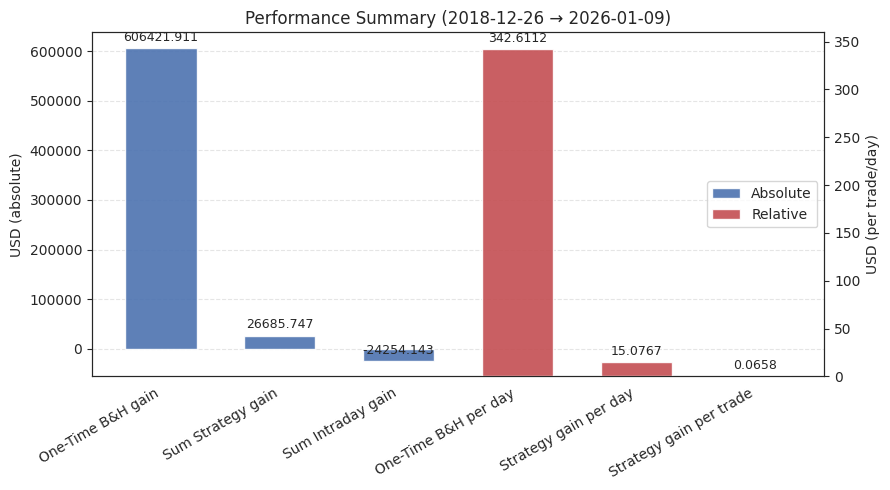

Rolling monthly summary (each metric carries its own capital forward):

Monthly Summary 2018-12 (2018-12-26 = 36.657 → 2018-12-31 = 39.537)
Num. trading days: 4  Trades Count: 1295
One-Time B&H gain: 7324.421 | start: 100000.000 | final: 107324.421 | PnL%: 7.32%
Sum Strategy gain: -1255.998 | start: 100000.000 | final: 98744.002 | PnL%: -1.26%
Sum Intraday gain: 4339.503 | start: 100000.000 | final: 104339.503 | PnL%: 4.34%

Monthly Summary 2019-01 (2019-01-02 = 39.537 → 2019-01-31 = 41.734)
Num. trading days: 21  Trades Count: 7357
One-Time B&H gain: 6127.565 | start: 107324.421 | final: 113451.986 | PnL%: 5.71%
Sum Strategy gain: -1206.736 | start: 98744.002 | final: 97537.266 | PnL%: -1.22%
Sum Intraday gain: 7326.999 | start: 104339.503 | final: 111666.502 | PnL%: 7.02%

Monthly Summary 2019-02 (2019-02-01 = 41.734 → 2019-02-28 = 43.351)
Num. trading days: 19  Trades Count: 5806
One-Time B&H gain: 4553.100 | start: 113451.986 | final: 118005.086 | PnL%: 4.01%
Sum Strategy gain: 243

In [9]:
# importlib.reload(params) ######
# importlib.reload(strategies) ######
# importlib.reload(plots) ######

year, month = map(int, params.month_to_check.split("-"))
dates_in_month = [date for date in sim_results if date.year == year and date.month == month]

if not dates_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for date in sorted(dates_in_month):
        df_at_date_plot, trades_at_date, stats_at_date = sim_results[date]
        plots.plot_trades(
            df                 = df_at_date_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            axis_sig_thresh    = 'second',
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            autoscale          = False
        )
        
        print(f"\n{' ' * 50}******* Performance for {date.strftime('%Y-%m-%d')} *******\n")
        for k,v in stats_at_date.items(): # Print stats dict for each date nicely
            print(f"{k}:\n" + "\n".join("  "+L for L in (v if isinstance(v,list) else str(v).splitlines())))
        print("\n" + "="*160 + "\n")

# final visualizations and monthly aggregations
strategies.aggregate_performance(df = df_inds,
                                 sim_results = sim_results,
                                 sess_start = sess_start)
